In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
%matplotlib notebook

In [37]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pyFish
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from tqdm import tqdm
import pickle

In [4]:
fn = lambda t,a,b,c: a*np.exp((-1/b)*t) + c

In [5]:
autocorr = pyFish.AutoCorrelation(fft=True)

In [6]:
metrics = pyFish.metrics()

In [46]:
def save_data(Mx, My, f_name, N=16, t_int=0.12):
    max_dt = autocorr._get_autocorr_time(Mx**2 + My**2)
    data_dict = dict()
    for n in tqdm(range(1, N+1), desc='Generating data'):
        if int((n/N)*max_dt) < 1:
            continue
        ch = pyFish.Characterize([Mx, My], t=None, t_int=t_int, dt=int((n/N)*max_dt))
        data_dict[int((n/N)*max_dt)] = ch.data()
    with open(f_name, 'wb') as handle:
        pickle.dump(data_dict, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [35]:
def slider(Mx, My, N=16, t_int=0.12, data_file=None):
    if data_file is None:
        max_dt = autocorr._get_autocorr_time(Mx**2 + My**2)
        data_dict = dict()
        for n in tqdm(range(1, N+1), desc='Generating data'):
            if int((n/N)*max_dt) < 1:
                continue
            ch = pyFish.Characterize([Mx, My], t=None, t_int=t_int, dt=int((n/N)*max_dt))
            data_dict[int((n/N)*max_dt)] = ch.data()
    else:
        with open(data_file, 'rb') as handle:
            data_dict = pickle.load(handle)

    fig = make_subplots(rows=2, cols=2,
                        specs=[[{'is_3d': True}, {'is_3d': True}],
                               [{'is_3d': True}, {'is_3d': True}]],
                        print_grid=False, subplot_titles=('driftX','driftY','diffX','diffY'),
                       horizontal_spacing=0.01,
                       vertical_spacing=0.05,)
    op_x, op_y = np.arange(-1,1,0.1), np.arange(-1,1,0.1)
    x, y = np.meshgrid(op_x, op_y)
    n = ['driftX', 'driftY', 'diffX', 'diffY']

    flag = 1
    for dt in data_dict:
        data = data_dict[dt]
        visible = 'legendonly'
        if flag:
            visible = True
        k = 0
        for r in range(1,3):
            for c in range(1,3):
                marker_colour = 'blue'
                if k%2: marker_colour = 'red'
                fig.append_trace(
                    go.Scatter3d(
                        x=(x.flatten()),
                        y=(y.flatten()),
                        z=(data[k].flatten()),
                        opacity=0.8,
                        mode='markers',
                        marker=dict(size=3,color=marker_colour),
                        name="{}, {}".format(n[k], dt),visible=visible),
                    row=r, col=c,)
                k = k + 1
        flag = 0


    scene = dict(xaxis = dict(showbackground=True),
                    yaxis = dict(showbackground=True),
                    zaxis = dict(showbackground=True,),
                    xaxis_title='mx',
                    yaxis_title='my',
                    zaxis_title='Z',)

    fig.update_layout(
        autosize=False,
        scene_aspectmode='cube',
        scene1 = scene,
        scene2 = scene,
        scene3 = scene,
        scene4 = scene,
        title_text='3D subplots',
        height=800,
        width=800,
    )

    dt_s = list(data_dict.keys())
    steps = []
    for i in range(len(data_dict)):
        step = dict(
            method = 'update',  
            #args = ['visible', ['legendonly'] * len(fig.data),],
            args=[{"visible": [False] * len(fig.data)},
                  {"title": "Slider switched to dt = " + str(dt_s[i])}],  # layout attribute
        )
        #step['args'][0][i*4:i*4+4] = [True for j in range(4)]
        step['args'][0]['visible'][i*4:i*4+4] = [True for j in range(4)]
        steps.append(step)

    sliders = [dict(
        currentvalue={"prefix": "dt: "},
        steps = steps,
    )]

    fig.layout.sliders = sliders

    return fig

In [8]:
def trim_data(Mx, My, trim_percent=0.3, n_parts=4, seed=1, random=False):
    Mx_trim, My_trim = Mx.copy(), My.copy()
    if seed is not None:
        np.random.seed(1)
    if random:
        idx = np.random.randint(0, len(Mx), size=int(len(Mx)* trim_percent))
        Mx_trim[idx] = np.nan
        My_trim[idx] = np.nan
        return Mx_trim, My_trim, Mx_trim**2 + My_trim**2
    buff = int((len(Mx)*trim_percent)/n_parts)
    for i in range(n_parts):
        if not i:
            r = np.random.randint(0, len(Mx)-buff)
        while True:
            r_ = np.random.randint(0, len(Mx))
            if r not in range(r_, r_+buff):
                r = r_
                break
        Mx_trim[r:r+buff] = np.nan
        My_trim[r:r+buff] = np.nan
    return Mx_trim, My_trim, Mx_trim**2 + My_trim**2

In [9]:
def plot_acf(X, title=None):
    t, acf = autocorr._acf(X, 1000)
    coeff1, coeff2 = autocorr._fit_exp(t, acf)
    a,b,c = coeff1
    f = plt.figure()
    plt.plot(t, acf, label='acf')
    plt.plot(t, fn(t,a,b,c), label='exp_fit')
    if title:
        plt.title("{}, autocorr time = {}".format(title, np.ceil(b)))
    plt.legend()
    print(b)
    return f

In [10]:
Mx_2, My_2 = np.loadtxt('syn_pairwise.txt').T
Mx_3, My_3 = np.loadtxt('syn_ternary.txt').T

In [11]:
M_2 = Mx_2**2 + My_2**2
M_3 = Mx_3**2 + My_3**2

# Pairwise

<IPython.core.display.Javascript object>


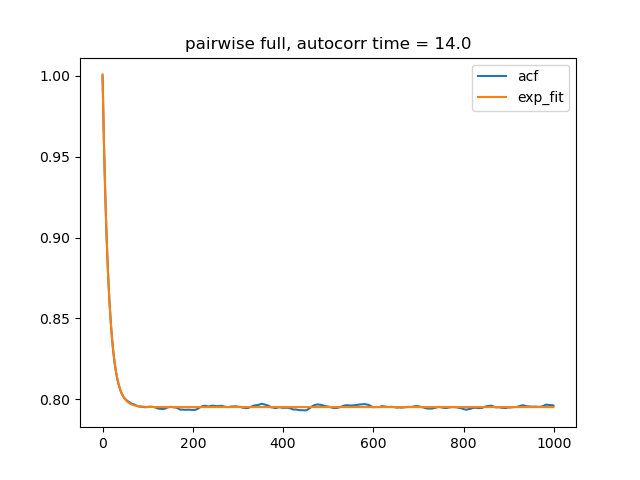

13.330889514008469


In [12]:
f = plot_acf(M_2, title='pairwise full')

In [13]:
ch_2_full = pyFish.Characterize([Mx_2, My_2], t=None, t_int=0.12)
ch_2_full.parameters()

{'dt_': 'auto',
 't_int': '0.12',
 't_lag': '1000',
 'simple_method': 'True',
 'max_order': '10',
 'inc': '0.01',
 'inc_x': '0.1',
 'inc_y': '0.1',
 'delta_t': '1',
 'order_metric': 'R2_adj',
 'fft': 'True',
 'drift_order': '1',
 'diff_order': '2',
 'n_trials': '1',
 'vector': 'True',
 'autocorrelation_time': '13.330889514008469',
 'dt': '13',
 'gaussian_noise': 'True',
 'k': '14.219560478092657',
 'l_lim': '-185.9421959118779',
 'h_lim': '201.7342895119047'}

In [ ]:
ch_2_full.visualize()

In [40]:
s_2 = slider(Mx_2, My_2, data_file='slider_data_parwise.pkl')
s_2

In [61]:
Mx_trim_2, My_trim_2, M_trim_2 = trim_data(Mx_2, My_2,n_parts=10)
len(Mx_trim_2[np.isnan(Mx_trim_2)])/len(Mx_trim_2)

0.2707812372509587

<IPython.core.display.Javascript object>


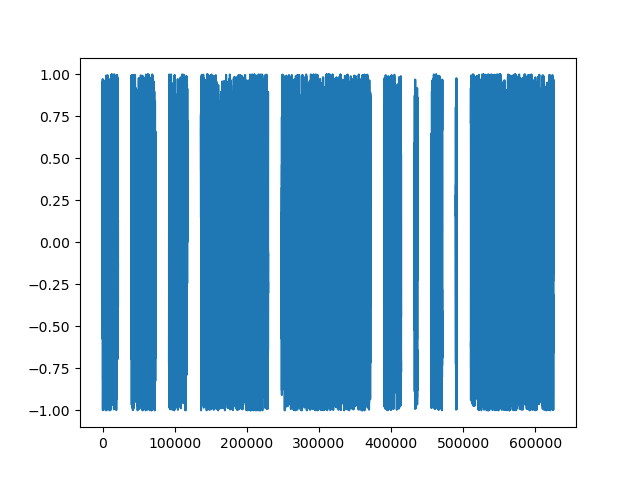

In [62]:
plt.figure()
plt.plot(Mx_trim_2)
plt.show()

<IPython.core.display.Javascript object>


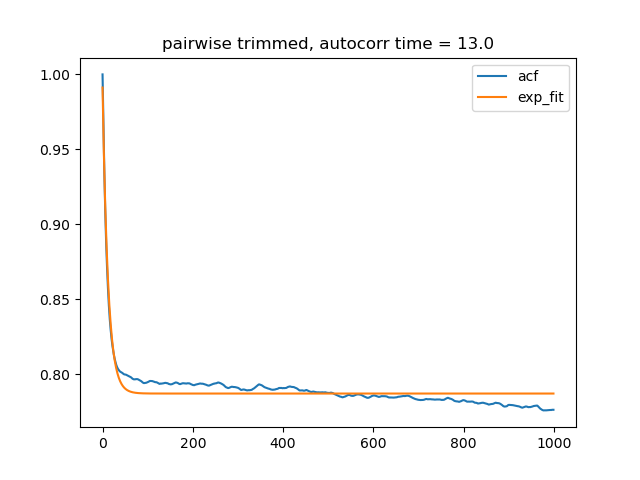

12.13610303680106


In [63]:
f = plot_acf(M_trim_2, title='pairwise trimmed')

In [18]:
ch_2_trim = pyFish.Characterize([Mx_trim_2, My_trim_2], t=None, t_int=0.12)
ch_2_trim.parameters()

{'dt_': 'auto',
 't_int': '0.12',
 't_lag': '1000',
 'simple_method': 'True',
 'max_order': '10',
 'inc': '0.01',
 'inc_x': '0.1',
 'inc_y': '0.1',
 'delta_t': '1',
 'order_metric': 'R2_adj',
 'fft': 'True',
 'drift_order': '1',
 'diff_order': '2',
 'n_trials': '1',
 'vector': 'True',
 'autocorrelation_time': '10.087782203514845',
 'dt': '10',
 'gaussian_noise': 'True',
 'k': '11.685469869369651',
 'l_lim': '-162.25790636910187',
 'h_lim': '154.68857084112972'}

In [ ]:
ch_2_trim.visualize()

In [50]:
#save_data(Mx_trim_2, My_trim_2, f_name='slider_data_pairwise_trim.pkl')

In [42]:
s_trim_2 = slider(Mx_trim_2, My_trim_2, N=16)

Generating data: 100%|██████████| 16/16 [03:23<00:00, 12.71s/it]


In [43]:
s_trim_2

In [51]:
Mx_trim_2_r, My_trim_2_r, M_trim_2_r = trim_data(Mx_2, My_2, random=True)

In [54]:
len(Mx_trim_2_r[np.isnan(Mx_trim_2_r)])/len(Mx_trim_2_r)

0.25893892779263

<IPython.core.display.Javascript object>


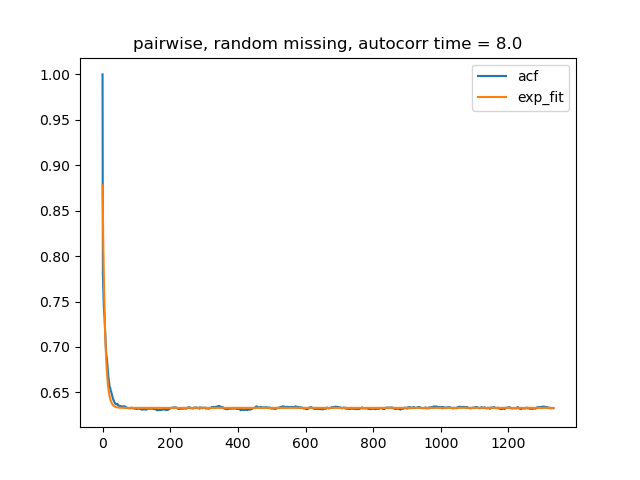

7.067171424371416


In [53]:
f = plot_acf(M_trim_2_r, title='pairwise, random missing')

# Ternary

<IPython.core.display.Javascript object>


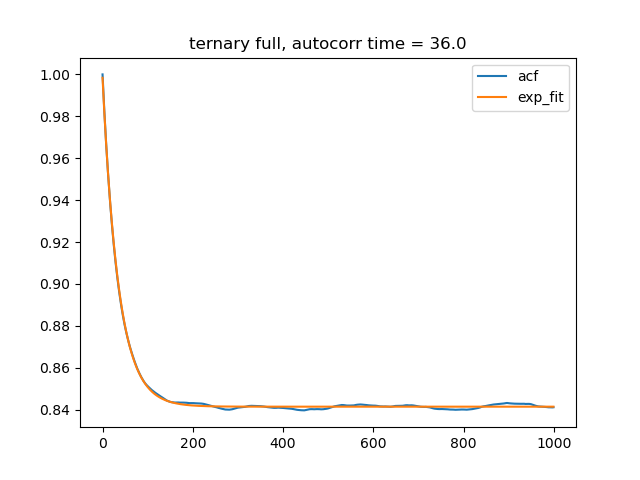

35.45905562757836


In [23]:
f = plot_acf(M_3, title='ternary full')

In [24]:
ch_3_full = pyFish.Characterize([Mx_3, My_3], t=None, t_int=0.12, dt=3)
ch_3_full.parameters()

{'dt_': '3',
 't_int': '0.12',
 't_lag': '1000',
 'simple_method': 'True',
 'max_order': '10',
 'inc': '0.01',
 'inc_x': '0.1',
 'inc_y': '0.1',
 'delta_t': '1',
 'order_metric': 'R2_adj',
 'fft': 'True',
 'drift_order': '1',
 'diff_order': '2',
 'n_trials': '1',
 'vector': 'True',
 'autocorrelation_time': '35.45905562757836',
 'dt': '3',
 'gaussian_noise': 'True',
 'k': '18.582551344727825',
 'l_lim': '-144.08967923407852',
 'h_lim': '181.66185698544837'}

In [ ]:
ch_3_full.visualize()

In [25]:
s_3 = slider(Mx_3, My_3, N=16)
s_3

Generating data: 100%|██████████| 16/16 [03:48<00:00, 14.27s/it]


In [83]:
Mx_trim_3, My_trim_3, M_trim_3 = trim_data(Mx_3, My_3)

In [84]:
len(Mx_trim_3[np.isnan(Mx_trim_3)])/len(Mx_trim_3)

0.29999931137538993

<IPython.core.display.Javascript object>


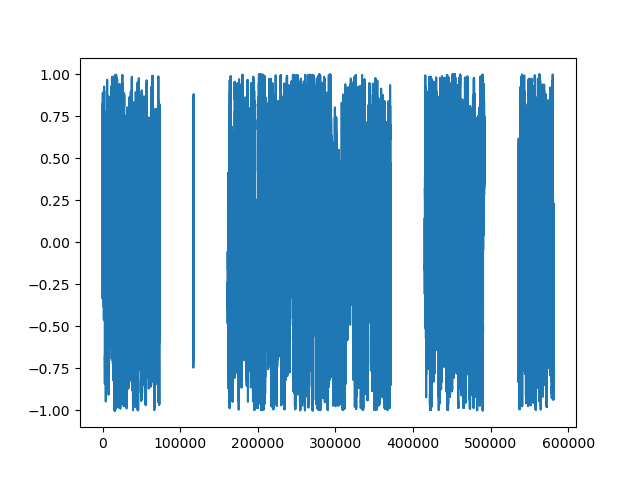

In [85]:
plt.figure()
plt.plot(Mx_trim_3)
plt.show()

<IPython.core.display.Javascript object>


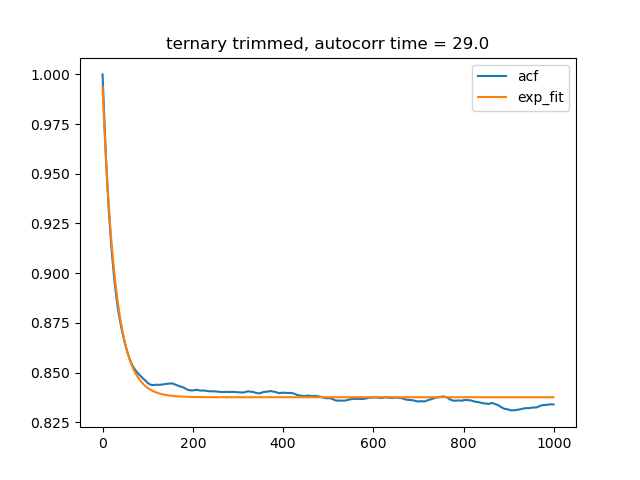

28.502104405924328


In [86]:
f = plot_acf(M_trim_3[:], title='ternary trimmed')

In [30]:
ch_3_trim = pyFish.Characterize([Mx_trim_3, My_trim_3], t=None, t_int=0.12, dt=3)
ch_3_trim.parameters()

{'dt_': '3',
 't_int': '0.12',
 't_lag': '1000',
 'simple_method': 'True',
 'max_order': '10',
 'inc': '0.01',
 'inc_x': '0.1',
 'inc_y': '0.1',
 'delta_t': '1',
 'order_metric': 'R2_adj',
 'fft': 'True',
 'drift_order': '1',
 'diff_order': '2',
 'n_trials': '1',
 'vector': 'True',
 'autocorrelation_time': '28.502104405924328',
 'dt': '3',
 'gaussian_noise': 'True',
 'k': '-3.9078614120799573',
 'l_lim': '-146.62508236258853',
 'h_lim': '117.87713796663354'}

In [ ]:
ch_3_trim.visualize()

In [49]:
#save_data(Mx_trim_3, My_trim_3, f_name='slider_data_ternary_trim.pkl')

In [31]:
s_trim_3 = slider(Mx_trim_3, My_trim_3, N=16)
s_trim_3

Generating data: 100%|██████████| 16/16 [03:28<00:00, 13.05s/it]


In [32]:
Mx_trim_3_r, My_trim_3_r, M_trim_3_r = trim_data(Mx_3, My_3, random=True)

In [33]:
len(M_trim_3_r[np.isnan(M_trim_3_r)])/len(M_trim_3_r)

0.2589899942844157

<IPython.core.display.Javascript object>


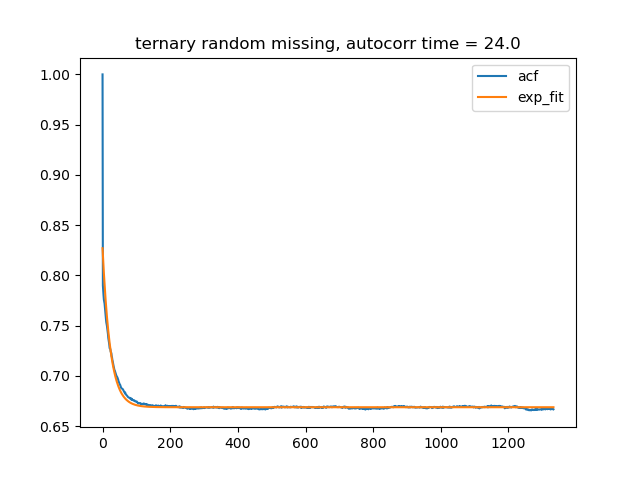

23.031604014323694


In [34]:
f = plot_acf(M_trim_3_r, title='ternary random missing')